# **Importing the Necessary Modules**

In [ ]:
import numpy as np
import pandas as pd
pd.set_option('display.max_columns', None)
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_style("whitegrid")
import plotly.graph_objects as go
import plotly.express as px
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OneHotEncoder, MinMaxScaler
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from xgboost import XGBClassifier
import optuna
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import f1_score
from sklearn.preprocessing import label_binarize
from sklearn.metrics import (
    classification_report,
    confusion_matrix,
    ConfusionMatrixDisplay,
    precision_recall_curve,
    PrecisionRecallDisplay,
    auc,
    average_precision_score
)
import joblib
import os
import re
from collections import defaultdict, Counter

# **Loading The Dataset**

In [225]:
df = pd.read_csv("/mnt/d/TREASURY/ORDERS UNDER WORKING/icecarnage/Dataset/water_leak_detection_dataset.csv")
df.head()

,meter_id,timestamp,flow_rate_lps,total_flow_volume_m3,nighttime_flow_rate_lps,flow_rate_change_per_min,pressure_psi,min_pressure_24h_psi,leak_noise_score,acoustic_amplitude_db,vibration_frequency_hz,consumption_gal,zero_flow_duration_min,unusual_usage_flag,pipe_id,pipe_diameter_mm,pipe_material,pipe_age_years,coordinates_latlon,valve_status,valve_position_percent,pump_state,pump_flow_rate_lps,failure_type,repair_date,incident_latlon,repair_duration_hr,customer_id,monthly_usage_gal,bill_amount_usd,usage_baseline_gal
0,MTR-0006,2025-07-13 00:00:00,12.45,6425.0,2.81,-0.59,35.77,40.23,0.24,65.8,2908.1,2.11,246,0,P-00000,200,Ductile Iron,28,"37.837975, -122.119855",Open,72.2,OFF,12.36,none,2023-05-24,"37.845024, -122.174525",11.5,CUST-8727,2301.45,31.71,1875.56
1,MTR-0003,2025-07-13 01:00:00,11.42,3438.6,1.92,-0.35,42.17,41.70,0.65,58.8,2442.8,8.63,7,0,P-00001,150,PVC,13,"37.839209, -122.12492300000001",Partial,4.0,ON,58.07,none,2023-06-05,"37.835188, -122.12943800000001",3.6,CUST-1920,2733.64,72.82,1461.47
2,MTR-0007,2025-07-13 02:00:00,9.14,2198.7,2.07,0.82,50.82,44.30,0.81,56.4,2725.8,4.01,140,0,P-00002,100,Ductile Iron,39,"37.812549, -122.12272300000001",Partial,40.5,OFF,43.96,none,2023-02-12,"37.852155, -122.187535",7.9,CUST-5920,2787.95,32.69,1582.39
3,MTR-0004,2025-07-13 03:00:00,13.20,1685.8,2.63,0.39,40.35,40.32,0.61,57.6,1004.2,2.93,7,0,P-00003,200,Ductile Iron,24,"37.823693, -122.132261",Open,51.6,ON,41.57,none,2023-07-05,"37.896141, -122.136409",6.2,CUST-3418,2839.59,79.25,2544.54
4,MTR-0006,2025-07-13 04:00:00,12.56,9464.8,0.77,-0.16,41.10,40.81,0.86,65.3,2435.1,1.52,93,0,P-00004,100,PVC,41,"37.856578, -122.10708600000001",Open,58.1,ON,23.53,blockage,2023-11-15,"37.876587, -122.192079",10.6,CUST-7475,1189.70,68.25,1151.05


# **Checking the Shape of the Dataset**

In [226]:
df.shape

(240, 31)

**There are 240 samples each with 31 features**

# **Displaying the DataFrame Summary: Column Data Types, Non-Null Counts, Memory Usage**

In [227]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 240 entries, 0 to 239
Data columns (total 31 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   meter_id                  240 non-null    object 
 1   timestamp                 240 non-null    object 
 2   flow_rate_lps             240 non-null    float64
 3   total_flow_volume_m3      240 non-null    float64
 4   nighttime_flow_rate_lps   240 non-null    float64
 5   flow_rate_change_per_min  240 non-null    float64
 6   pressure_psi              240 non-null    float64
 7   min_pressure_24h_psi      240 non-null    float64
 8   leak_noise_score          240 non-null    float64
 9   acoustic_amplitude_db     240 non-null    float64
 10  vibration_frequency_hz    240 non-null    float64
 11  consumption_gal           240 non-null    float64
 12  zero_flow_duration_min    240 non-null    int64  
 13  unusual_usage_flag        240 non-null    int64  
 14  pipe_id   

# **Checking For Duplicate Samples**

In [228]:
df.duplicated().sum()

0

**No duplicate samples are present in the dataset**

# **Converting String Dates to Datetime Format**

In [ ]:
df['timestamp'] = pd.to_datetime(df['timestamp'])
df['repair_date'] = pd.to_datetime(df['repair_date'])

# **Splitting and Converting Coordinate Strings into Numeric Latitude and Longitude**

In [230]:
df[['coord_lat', 'coord_lon']] = (
    df['coordinates_latlon']
      .str.split(',', expand=True)
      .astype(float)
)

df[['inc_lat', 'inc_lon']] = (
    df['incident_latlon']
      .str.split(',', expand=True)
      .astype(float)
)

# **Optimizing Categorical Features Using Pandas 'category' Type**

In [231]:
for col in ['meter_id','pipe_id','customer_id',
            'pipe_material','valve_status',
            'pump_state','failure_type']:
    df[col] = df[col].astype('category')

# **Again Displaying the DataFrame Summary: Column Data Types, Non-Null Counts, Memory Usage**

In [232]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 240 entries, 0 to 239
Data columns (total 35 columns):
 #   Column                    Non-Null Count  Dtype         
---  ------                    --------------  -----         
 0   meter_id                  240 non-null    category      
 1   timestamp                 240 non-null    datetime64[ns]
 2   flow_rate_lps             240 non-null    float64       
 3   total_flow_volume_m3      240 non-null    float64       
 4   nighttime_flow_rate_lps   240 non-null    float64       
 5   flow_rate_change_per_min  240 non-null    float64       
 6   pressure_psi              240 non-null    float64       
 7   min_pressure_24h_psi      240 non-null    float64       
 8   leak_noise_score          240 non-null    float64       
 9   acoustic_amplitude_db     240 non-null    float64       
 10  vibration_frequency_hz    240 non-null    float64       
 11  consumption_gal           240 non-null    float64       
 12  zero_flow_duration_min

# **Printing the Statistical Summary For Numerical Features**

In [233]:
df.describe()

,timestamp,flow_rate_lps,total_flow_volume_m3,nighttime_flow_rate_lps,flow_rate_change_per_min,pressure_psi,min_pressure_24h_psi,leak_noise_score,acoustic_amplitude_db,vibration_frequency_hz,consumption_gal,zero_flow_duration_min,unusual_usage_flag,pipe_diameter_mm,pipe_age_years,valve_position_percent,pump_flow_rate_lps,repair_date,repair_duration_hr,monthly_usage_gal,bill_amount_usd,usage_baseline_gal,coord_lat,coord_lon,inc_lat,inc_lon
count,240,240.000000,240.000000,240.000000,240.000000,240.000000,240.000000,240.000000,240.000000,240.000000,240.000000,240.000000,240.000000,240.000000,240.000000,240.000000,240.000000,240,240.000000,240.000000,240.000000,240.000000,240.000000,240.000000,240.000000,240.000000
mean,2025-07-13 11:30:00,9.894458,5608.394167,2.572917,0.004292,45.380042,39.761958,0.497208,60.042083,2011.215833,5.298708,140.525000,0.083333,175.833333,27.562500,47.500833,33.300167,2024-02-09 14:18:00,6.404167,2042.380583,68.732333,1968.448000,37.846989,-122.148556,37.848648,-122.151428
min,2025-07-13 00:00:00,2.310000,1023.400000,0.550000,-2.000000,32.720000,35.000000,0.000000,46.200000,1004.200000,0.030000,0.000000,0.000000,100.000000,5.000000,0.400000,10.010000,2022-10-19 00:00:00,1.000000,1014.720000,20.590000,1002.860000,37.800003,-122.199362,37.800208,-122.199768
25%,2025-07-13 05:45:00,7.800000,3464.100000,1.695000,-1.082500,41.847500,37.345000,0.230000,56.900000,1483.575000,2.750000,78.500000,0.000000,150.000000,17.000000,21.550000,19.927500,2023-06-14 12:00:00,3.375000,1569.302500,44.000000,1451.942500,37.822906,-122.171998,37.824233,-122.178299
50%,2025-07-13 11:30:00,9.790000,5823.650000,2.610000,0.085000,45.420000,39.765000,0.500000,59.450000,2058.600000,5.580000,137.500000,0.000000,200.000000,27.000000,48.600000,30.425000,2024-02-24 00:00:00,6.300000,2055.480000,69.295000,1895.620000,37.842626,-122.145650,37.847789,-122.151111
75%,2025-07-13 17:15:00,11.722500,7747.175000,3.512500,1.107500,49.405000,41.770000,0.750000,63.900000,2502.075000,7.612500,205.000000,0.000000,250.000000,38.000000,67.575000,47.235000,2024-10-12 18:00:00,9.225000,2516.355000,94.567500,2551.637500,37.871505,-122.124718,37.873444,-122.124910
max,2025-07-13 23:00:00,19.760000,9975.300000,4.490000,2.000000,60.710000,44.950000,0.990000,72.700000,2999.400000,9.990000,291.000000,1.000000,250.000000,49.000000,99.700000,59.790000,2025-06-10 00:00:00,12.000000,2993.700000,119.860000,2998.410000,37.899258,-122.100967,37.899832,-122.100095
std,NaN,3.055474,2556.793835,1.086184,1.241978,5.551611,2.709956,0.299482,5.096444,587.282714,2.857017,82.524191,0.276963,56.198741,12.172241,28.246756,15.003741,NaN,3.366532,568.055990,28.377891,602.339054,0.029203,0.028745,0.028805,0.029897


# **Printing the Statistical Summary For Categorical Features**

In [234]:
df.describe(include=['object', 'category'])

,meter_id,pipe_id,pipe_material,coordinates_latlon,valve_status,pump_state,failure_type,incident_latlon,customer_id
count,240,240,240,240,240,240,240,240,240
unique,10,10,4,240,3,2,4,240,237
top,MTR-0006,P-00000,Copper,"37.837975, -122.119855",Partial,ON,none,"37.845024, -122.174525",CUST-6424
freq,31,24,68,1,86,125,195,1,2


# **Checking for Missing Values**

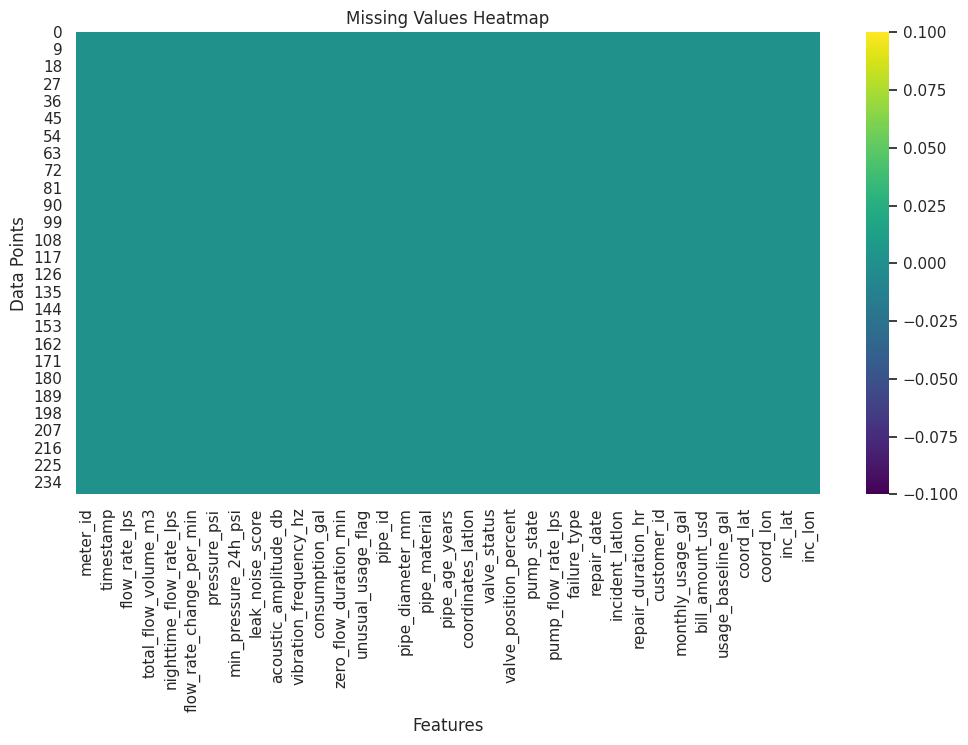

Missing values summary:

meter_id: 0 ----- missing values, 0.00%
timestamp: 0 ----- missing values, 0.00%
flow_rate_lps: 0 ----- missing values, 0.00%
total_flow_volume_m3: 0 ----- missing values, 0.00%
nighttime_flow_rate_lps: 0 ----- missing values, 0.00%
flow_rate_change_per_min: 0 ----- missing values, 0.00%
pressure_psi: 0 ----- missing values, 0.00%
min_pressure_24h_psi: 0 ----- missing values, 0.00%
leak_noise_score: 0 ----- missing values, 0.00%
acoustic_amplitude_db: 0 ----- missing values, 0.00%
vibration_frequency_hz: 0 ----- missing values, 0.00%
consumption_gal: 0 ----- missing values, 0.00%
zero_flow_duration_min: 0 ----- missing values, 0.00%
unusual_usage_flag: 0 ----- missing values, 0.00%
pipe_id: 0 ----- missing values, 0.00%
pipe_diameter_mm: 0 ----- missing values, 0.00%
pipe_material: 0 ----- missing values, 0.00%
pipe_age_years: 0 ----- missing values, 0.00%
coordinates_latlon: 0 ----- missing values, 0.00%
valve_status: 0 ----- missing values, 0.00%
valve_positi

In [235]:
missing_values = df.isnull()

# Plotting missing values heatmap
plt.figure(figsize = (12, 6))
sns.heatmap(missing_values, cmap = 'viridis', cbar = True)
plt.title('Missing Values Heatmap')
plt.xlabel('Features')
plt.ylabel('Data Points')
plt.show()

# Calculating the number of missing values and their percentage
missing_count = df.isnull().sum()
missing_percentage = (missing_count / len(df)) * 100

# Printing the number and percentage of missing values for each column
print("Missing values summary:\n")
for column in df.columns:
    print(f"{column}: {missing_count[column]} {'-'* 5} missing values, {missing_percentage[column]:.2f}%")

**No missing values are present in the dataset**

# **Dropping Unwanted Features**

* **meter_id, pipe_id, customer_id:** These are just labels or tags. They don’t tell us anything about the leak itself—they only identify which meter, pipe, or customer we’re looking at.

* **repair_date, repair_duration_hr:** These happen after a leak is diagnosed and fixed. We won’t know them at the moment we want to predict the leak type, so they can’t help our real‑time decision.

* **bill_amount_usd, monthly_usage_gal:** These are monthly totals that come in days or weeks later. They mix in billing rules, corrections, and customer behavior changes, so they don’t reflect the immediate leak signals we need.

* **coordinates_latlon, incident_latlon:** As single text strings, they can’t be used mathematically. We’ll split them into numbers (latitude and longitude) first, then decide which geographic features matter.

* **consumption_gal:** This is the total water a customer uses over a billing period. We won’t know that total at the moment we are trying to detect or classify a leak—it only exists after the month is over. If the model learned from it, it would be cheating by using information from the future.

* **usage_baseline_gal:** This is an expected or average usage level (often based on past bills). Like the actual consumption, it’s calculated after the fact and can include adjustments or corrections. It doesn’t reflect the real‑time sensor signals we have when a leak first appears, so including it would again let the model peek at future information.

In [236]:
df = df.drop(columns=[
    'meter_id','pipe_id','customer_id',
    'repair_date','repair_duration_hr',
    'bill_amount_usd','monthly_usage_gal',
    'coordinates_latlon','incident_latlon', 
    'usage_baseline_gal', 'consumption_gal'
])

# **Engineered Time Features**

In [237]:
# Extracting the day of the week (0 = Monday, 6 = Sunday)
df['weekday'] = df['timestamp'].dt.weekday

# Extracting the month (1 to 12)
df['month'] = df['timestamp'].dt.month

# Extracting the day of the month (1 to 31)
df['day'] = df['timestamp'].dt.day

# Converting hour to sine and cosine value to capture cyclical time pattern
df['hour'] = df['timestamp'].dt.hour
df['hour_sin'] = np.sin(2 * np.pi * df['hour'] / 24)
df['hour_cos'] = np.cos(2 * np.pi * df['hour'] / 24)

# Dropping the original 'timestamp' column as we have engineered time features
df = df.drop(columns=['timestamp', 'hour'])

# **Defining the Feature Groups**

In [238]:
# Continuous numeric features
numeric_feats = [
    'flow_rate_lps',
    'total_flow_volume_m3',
    'nighttime_flow_rate_lps',
    'flow_rate_change_per_min',
    'pressure_psi',
    'min_pressure_24h_psi',
    'leak_noise_score',
    'acoustic_amplitude_db',
    'vibration_frequency_hz',
    'zero_flow_duration_min',
    'pipe_diameter_mm',
    'pipe_age_years',
    'valve_position_percent',
    'pump_flow_rate_lps'
]

# Binary feature
binary_feats = [
    'unusual_usage_flag'
]

# Nominal categorical features
categorical_feats = [
    'pipe_material',
    'valve_status',
    'pump_state'
]

# Time‑based features
time_feats = [
    'weekday',      # 0–6
    'month',        # 1–12
    'day',          # 1–31
    'hour_sin',     # cyclical
    'hour_cos'      # cyclical
]

# Location features
location_feats = [
    'coord_lat',
    'coord_lon',
    'inc_lat',
    'inc_lon'
]

# **Plotting Histograms To Check The Distribution of Numerical Features**

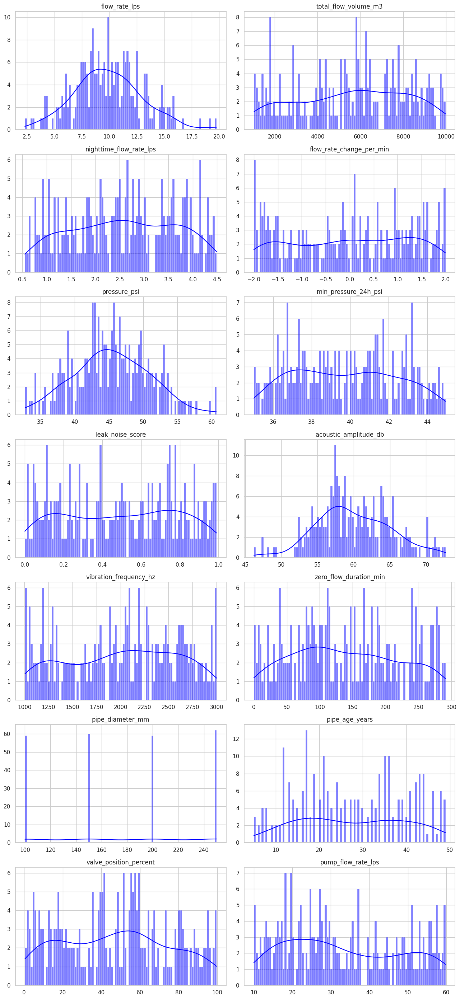

In [239]:
# number of bins
num_bins = 100

# Number of rows needed
num_rows = (len(numeric_feats) + 1) // 2

# Creating the subplots
fig, axes = plt.subplots(num_rows, 2, figsize= (13, 4 * num_rows))
axes = axes.flatten()

# Plotting the histograms
for i, feature in enumerate(numeric_feats):
    sns.histplot(df[feature], bins= num_bins, kde= True, ax=axes[i], color = 'blue')
    axes[i].set_title(feature)
    axes[i].set_xlabel('')
    axes[i].set_ylabel('')

for j in range(len(numeric_feats), len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.show()

# **Plotting the Box Plots for Numerical Features**

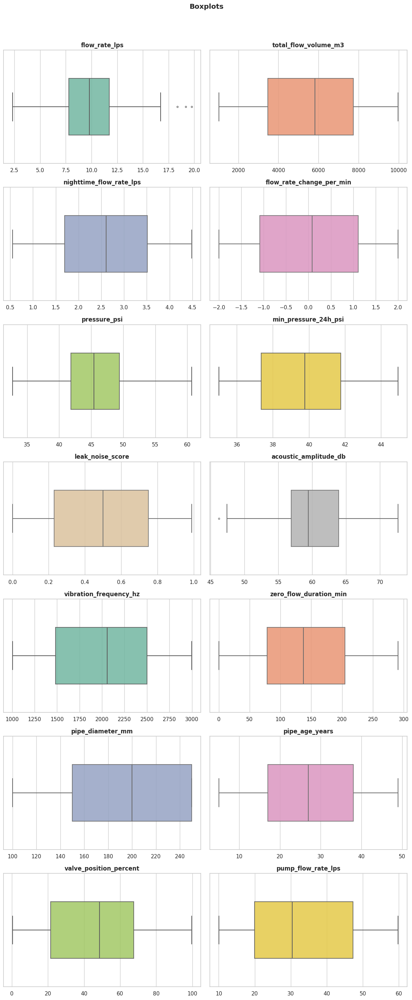

In [240]:
num_cols = 2
num_rows = (len(numeric_feats) + num_cols - 1) // num_cols
fig, axes = plt.subplots(num_rows, num_cols, figsize=(12, 4 * num_rows))
axes = axes.flatten()

# color palette
palette = sns.color_palette("Set2", len(numeric_feats))

# creating the boxplots
for i, col in enumerate(numeric_feats):
    sns.boxplot(x=df[col], ax=axes[i], color=palette[i % len(palette)],
                width=0.5, fliersize=3, linewidth=1.5, boxprops=dict(alpha=0.85))
    axes[i].set_title(f'{col}', fontweight='bold')
    axes[i].set_xlabel("")
    axes[i].tick_params(axis='x', labelsize=11)

for j in range(len(numeric_feats), num_rows * num_cols):
    fig.delaxes(axes[j])

plt.suptitle("Boxplots", fontweight='bold', y=1.02)
plt.tight_layout()
plt.show()

# **Capping the Outliers Using IQR Technique**

In [241]:
def cap_outliers(df, cols):
    for col in cols:
        Q1 = df[col].quantile(0.25)
        Q3 = df[col].quantile(0.75)
        IQR = Q3 - Q1
        lower, upper = Q1 - 1.5 * IQR, Q3 + 1.5 * IQR
        df[col] = df[col].clip(lower, upper)


# Applying the cap_outliers method
cap_outliers(df, numeric_feats)

# **Again Plotting the Boxplots to Confirm the Capping of Outliers**

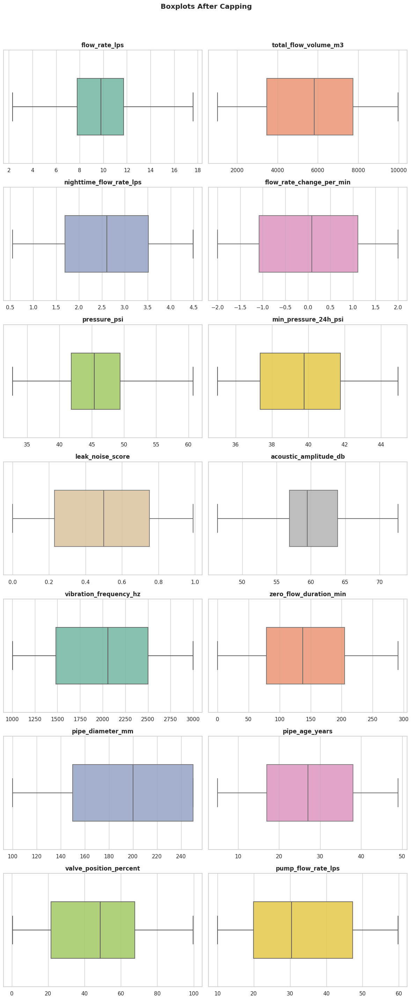

In [242]:
num_cols = 2
num_rows = (len(numeric_feats) + num_cols - 1) // num_cols
fig, axes = plt.subplots(num_rows, num_cols, figsize=(12, 4 * num_rows))
axes = axes.flatten()

# color palette
palette = sns.color_palette("Set2", len(numeric_feats))

# creating the boxplots
for i, col in enumerate(numeric_feats):
    sns.boxplot(x=df[col], ax=axes[i], color=palette[i % len(palette)],
                width=0.5, fliersize=3, linewidth=1.5, boxprops=dict(alpha=0.85))
    axes[i].set_title(f'{col}', fontweight='bold')
    axes[i].set_xlabel("")
    axes[i].tick_params(axis='x', labelsize=11)

for j in range(len(numeric_feats), num_rows * num_cols):
    fig.delaxes(axes[j])

plt.suptitle("Boxplots After Capping", fontweight='bold', y=1.02)
plt.tight_layout()
plt.show()

# **Creating a Bar Plot for Binary Feature**

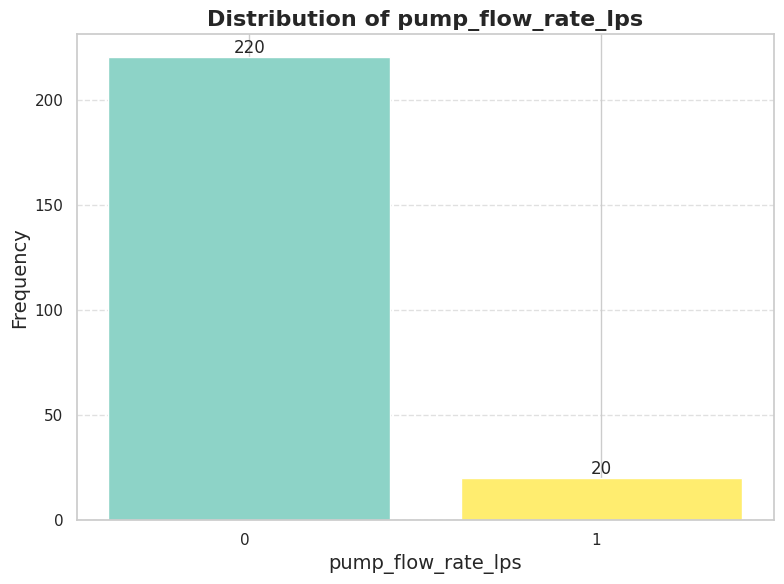

In [243]:
counts = df['unusual_usage_flag'].value_counts()

cmap = matplotlib.colormaps.get_cmap('Set3')
colors = cmap(np.linspace(0, 1, len(counts)))

# Plotting the barplot
plt.figure(figsize=(8, 6))
bars = plt.bar(counts.index.astype(str), counts.values, color=colors)

# Adding the counts on top of each bar
plt.bar_label(bars)

plt.title(f'Distribution of {col}', fontsize=16, fontweight='bold')
plt.xlabel(col, fontsize=14)
plt.ylabel('Frequency', fontsize=14)
plt.xticks(ha='right')
plt.grid(axis='y', linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()

# **Creating a Bar Plot for Nominal Categorical Feature**

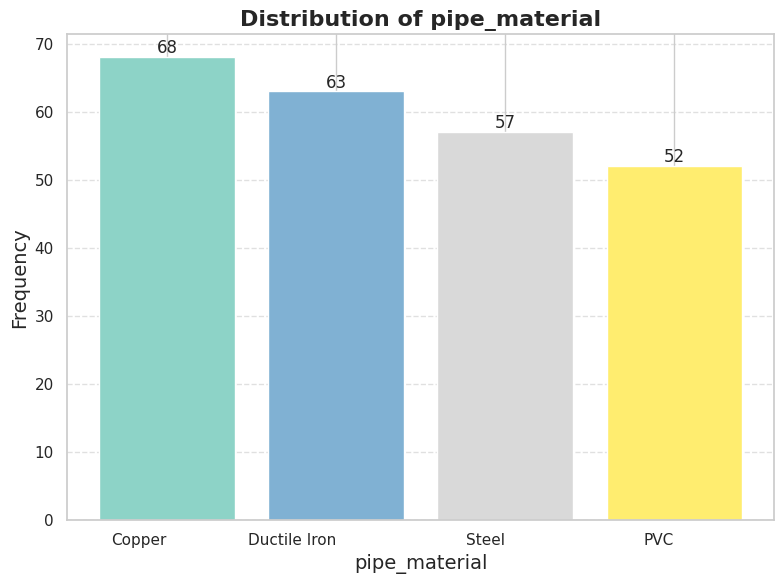

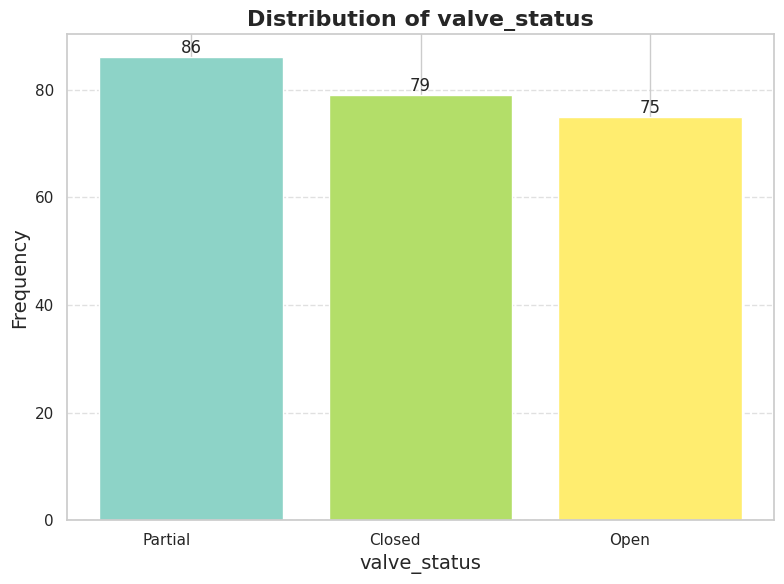

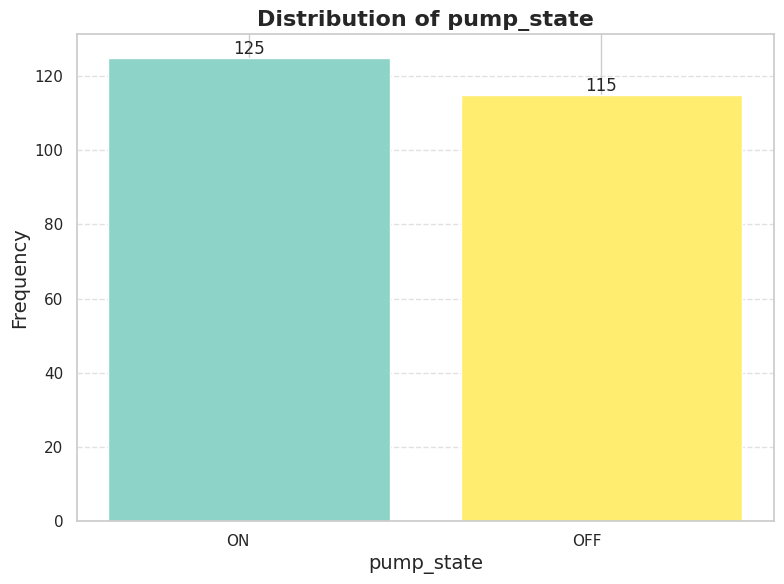

In [244]:
for col in categorical_feats:
    counts = df[col].value_counts()

    cmap = matplotlib.colormaps.get_cmap('Set3')
    colors = cmap(np.linspace(0, 1, len(counts)))

    # Plotting the barplot
    plt.figure(figsize=(8, 6))
    bars = plt.bar(counts.index.astype(str), counts.values, color=colors)

    # Adding the counts on top of each bar
    plt.bar_label(bars)

    plt.title(f'Distribution of {col}', fontsize=16, fontweight='bold')
    plt.xlabel(col, fontsize=14)
    plt.ylabel('Frequency', fontsize=14)
    plt.xticks(ha='right')
    plt.grid(axis='y', linestyle='--', alpha=0.6)
    plt.tight_layout()
    plt.show()

# **Plotting a Pie Chart to Check the Distribution of failure_type**

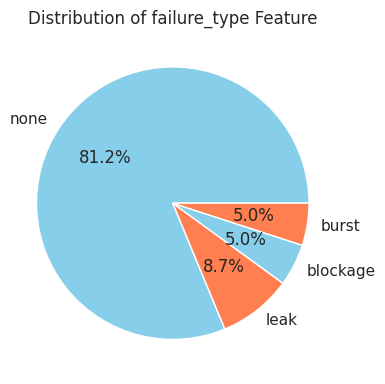

In [245]:
counts = df['failure_type'].value_counts()

# Plotting the pie chart
plt.figure(figsize=(4, 4))
plt.pie(
    counts,
    labels=counts.index,
    autopct='%1.1f%%',
    colors=['skyblue', 'coral']
)
plt.title('Distribution of failure_type Feature')
plt.axis('equal')
plt.tight_layout()
plt.show()

# **Interactive Scatter Plot of Leak Locations by Failure Type**

**Shows where each individual leak occurred and what type it was**

In [246]:
fig = go.Figure()

for ftype in df['failure_type'].unique():
    subset = df[df['failure_type'] == ftype]
    fig.add_trace(go.Scatter(
        x=subset['coord_lon'],
        y=subset['coord_lat'],
        mode='markers',
        name=ftype,
        opacity=0.8
    ))

fig.update_layout(
    title='Leak Locations by Failure Type',
    xaxis_title='Longitude',
    yaxis_title='Latitude',
    legend_title='Failure Type'
)

fig.show()

# **Interactive Density Heatmap of Meter Locations**

* **This interactive density heatmap highlights areas with high concentrations of meter locations or leak events. Darker regions indicate hotspots, helping us quickly identify geographic clusters. Lighter areas show sparse activity or few incidents.**

* **Shows where the most incidents (or meters) are concentrated overall, regardless of type**

In [247]:
fig = px.density_heatmap(
    df,
    x='coord_lon',
    y='coord_lat',
    nbinsx=50,
    nbinsy=50,
    color_continuous_scale='Viridis',
    title='Density of Meter Locations',
    labels={'coord_lon': 'Longitude', 'coord_lat': 'Latitude'}
)

fig.update_layout(
    xaxis_title='Longitude',
    yaxis_title='Latitude',
    coloraxis_colorbar=dict(title='Counts')
)

fig.show()

# **Overlay of Sensor Locations and Leak Incidents to Assess Coverage Gaps / Meter Coverage vs. Leak Locations**

**It shows are the meters actually covering the areas where leaks happen?**

In [248]:
fig = go.Figure()

# Adding the meter locations
fig.add_trace(go.Scattergl(
    x=df['coord_lon'],
    y=df['coord_lat'],
    mode='markers',
    name='Meters',
    marker=dict(size=5, opacity=1.0, color='lightblue'),
))

# Adding the leak incident locations
fig.add_trace(go.Scattergl(
    x=df['inc_lon'],
    y=df['inc_lat'],
    mode='markers',
    name='Incidents',
    marker=dict(size=9, opacity=0.5, color='darkred'),
))

fig.update_layout(
    title='Meter Locations vs. Leak Incidents',
    xaxis_title='Longitude',
    yaxis_title='Latitude',
    legend_title='Point Type',
    height=600
)

fig.show()

# **Plotting the Spearman Rank Correlation Heatmap**

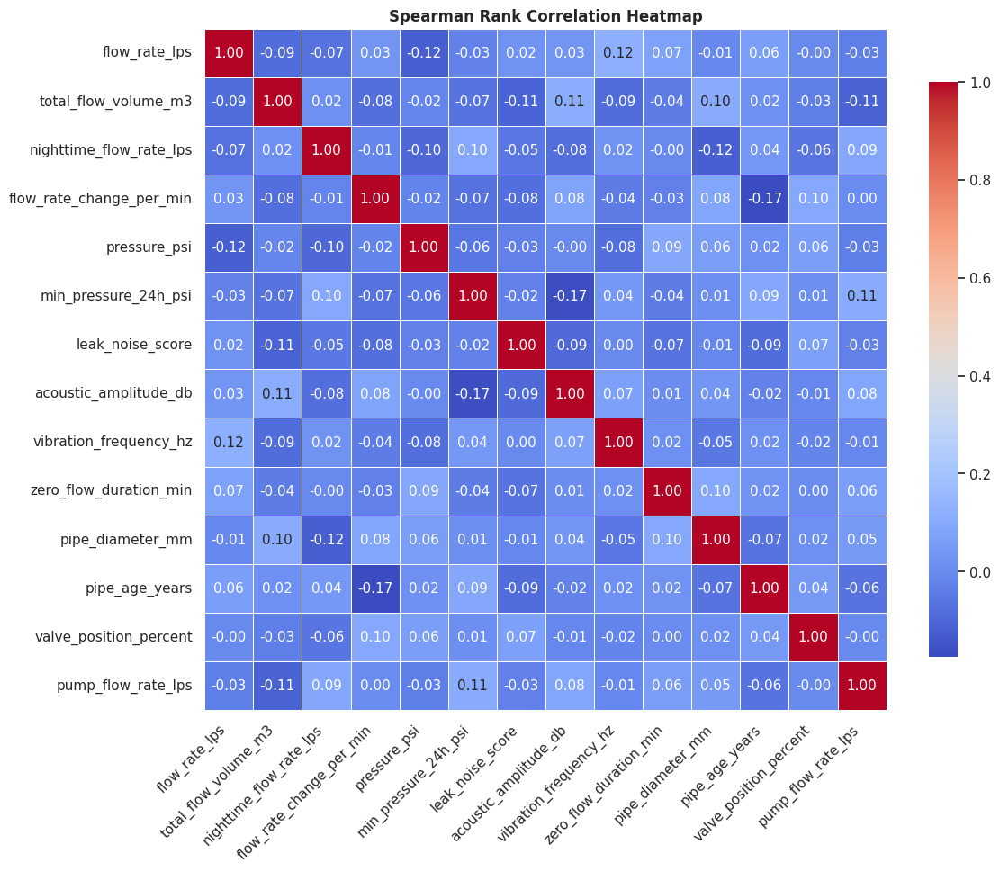

In [249]:
numerical_df = df[numeric_feats]

# Computing the Spearman correlation matrix
spearman_corr = numerical_df.corr(method='spearman')

# Plotting the heatmap
plt.figure(figsize=(12, 10))
sns.set(style="white")

sns.heatmap(spearman_corr,
            annot=True,
            fmt=".2f",
            cmap="coolwarm",
            square=True,
            linewidths=0.5,
            cbar_kws={"shrink": 0.8},
            annot_kws={"size": 11})

plt.title('Spearman Rank Correlation Heatmap', fontweight='bold')
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

# **Encoding the Target Feature**

In [250]:
le = LabelEncoder()
df['failure_label'] = le.fit_transform(df['failure_type'])

# **Preparing X and y**

In [251]:
X = df[numeric_feats + binary_feats + categorical_feats + time_feats + location_feats]
y = df['failure_label']

# **Splitting the Dataset into Train, Val and Test Set**

In [252]:
# Splitting into train+val (85%) and test (15%)
X_temp, X_test, y_temp, y_test = train_test_split(
    X, y, test_size=0.15, stratify=y, random_state=42
)

# Splitting train_val into train (70%) and val (15%)
val_size = 0.15 / 0.85
X_train, X_val, y_train, y_val = train_test_split(
    X_temp, y_temp, test_size=val_size, stratify=y_temp, random_state=42
)

# **Computing the Class Weights on Training Set**

In [253]:
train_counts = Counter(y_train)
total = sum(train_counts.values())
weights_by_class = {cls: total/count for cls, count in train_counts.items()}
sample_weights_train = y_train.map(weights_by_class).values

# **Building the Preprocessing Pipeline**

In [254]:
preprocessor = ColumnTransformer(transformers=[
    ('num', MinMaxScaler(), numeric_feats + binary_feats + time_feats + location_feats),
    ('cat', OneHotEncoder(handle_unknown='ignore'), categorical_feats)
])

# **Hyperparameter Tuning Using Optuna**

# **Objective Function For Optuna Tuning on Train and Validation Sets**

In [ ]:
def objective(trial):
    params = {
        'n_estimators': trial.suggest_int('n_estimators',    50, 1000),
        'max_depth': trial.suggest_int('max_depth',       3,   10),
        'learning_rate':trial.suggest_float('learning_rate', 1e-3, 0.3, log=True),
        'subsample': trial.suggest_float('subsample',     0.5,   1.0),
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.5, 1.0),
        'objective': 'multi:softprob',
        'eval_metric': 'mlogloss',
        'random_state': 42
    }

    # Building the pipeline
    model = Pipeline([
        ('preproc', preprocessor),
        ('xgb',     XGBClassifier(**params))
    ])

    # Stratified K-Fold
    cv = StratifiedKFold(n_splits=3, shuffle=True, random_state=42)
    scores = []
    for train_idx, valid_idx in cv.split(X_train, y_train):
        X_tr, X_va = X_train.iloc[train_idx], X_train.iloc[valid_idx]
        y_tr, y_va = y_train.iloc[train_idx], y_train.iloc[valid_idx]
        w_tr = sample_weights_train[train_idx]

        # fitting with sample weights
        model.fit(
            X_tr, y_tr,
            xgb__sample_weight=w_tr
        )
        # predicting and score
        preds = model.predict(X_va)
        scores.append(f1_score(y_va, preds, average='macro'))

    # returning mean macro-F1
    return sum(scores) / len(scores)


study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=30)
best_params = study.best_params

[I 2025-07-18 22:47:23,779] A new study created in memory with name: no-name-69d8e871-2f3b-442d-ba81-07478b570eeb
[I 2025-07-18 22:47:27,537] Trial 0 finished with value: 0.22458422312819518 and parameters: {'n_estimators': 320, 'max_depth': 9, 'learning_rate': 0.0014260637065689596, 'subsample': 0.5688579959990422, 'colsample_bytree': 0.9312752235357296}. Best is trial 0 with value: 0.22458422312819518.
[I 2025-07-18 22:47:29,672] Trial 1 finished with value: 0.22458422312819518 and parameters: {'n_estimators': 134, 'max_depth': 8, 'learning_rate': 0.015061039261219586, 'subsample': 0.7990625394424731, 'colsample_bytree': 0.6047967625723625}. Best is trial 0 with value: 0.22458422312819518.
[I 2025-07-18 22:47:34,778] Trial 2 finished with value: 0.27973681108204795 and parameters: {'n_estimators': 153, 'max_depth': 9, 'learning_rate': 0.12417811156039907, 'subsample': 0.8212296686245999, 'colsample_bytree': 0.9661876182489204}. Best is trial 2 with value: 0.27973681108204795.
[I 2025

# **Combining the Training and Validation Set to Train the Final Best Model**

In [261]:
X_trainval = pd.concat([X_train, X_val], axis=0)
y_trainval = pd.concat([y_train, y_val], axis=0)

# **Computing New weights_by_class**

In [262]:
tv_counts = Counter(y_trainval)
total_tv = sum(tv_counts.values())
weights_by_class_tv = {cls: total_tv/count for cls, count in tv_counts.items()}
sample_weights_tv = y_trainval.map(weights_by_class_tv).values

# **Training the Final Model Using the Best Parameters Found**

In [263]:
clf_final = Pipeline([
    ('preproc', preprocessor),
    ('xgb', XGBClassifier(
        **best_params,
        objective='multi:softprob',
        eval_metric='mlogloss',
        num_class=len(le.classes_),
        random_state=42
    ))
])

# Passing the weights here
clf_final.fit(
    X_trainval, y_trainval,
    xgb__sample_weight=sample_weights_tv
)

Pipeline(steps=[('preproc',
                 ColumnTransformer(transformers=[('num', MinMaxScaler(),
                                                  ['flow_rate_lps',
                                                   'total_flow_volume_m3',
                                                   'nighttime_flow_rate_lps',
                                                   'flow_rate_change_per_min',
                                                   'pressure_psi',
                                                   'min_pressure_24h_psi',
                                                   'leak_noise_score',
                                                   'acoustic_amplitude_db',
                                                   'vibration_frequency_hz',
                                                   'zero_flow_duration_min',
                                                   'pipe_diameter_mm',
                                                   'pipe_age_years',
                                                   'valve_po...
                               feature_types=None, feature_weights=None,
                               gamma=None, grow_policy=None,
                               importance_type=None,
                               interaction_constraints=None,
                               learning_rate=0.05001210229013169, max_bin=None,
                               max_cat_threshold=None, max_cat_to_onehot=None,
                               max_delta_step=None, max_depth=3,
                               max_leaves=None, min_child_weight=None,
                               missing=nan, monotone_constraints=None,
                               multi_strategy=None, n_estimators=763,
                               n_jobs=None, num_class=4, ...))])

# **Evaluating the Model on the Test Set**

In [264]:
y_pred = clf_final.predict(X_test)
y_proba = clf_final.predict_proba(X_test)

# Mapping back to the original labels
y_test_str = le.inverse_transform(y_test)
y_pred_str = le.inverse_transform(y_pred)

# **Printing the Classification Report for Test Set**

In [ ]:
print("Classification Report:\n", classification_report(y_test_str, y_pred_str, zero_division=0))

Classification Report:
               precision    recall  f1-score   support

    blockage       0.00      0.00      0.00         2
       burst       0.00      0.00      0.00         2
        leak       0.00      0.00      0.00         3
        none       0.80      0.97      0.88        29

    accuracy                           0.78        36
   macro avg       0.20      0.24      0.22        36
weighted avg       0.64      0.78      0.70        36



# **Confusion Matrix for Testing Set**

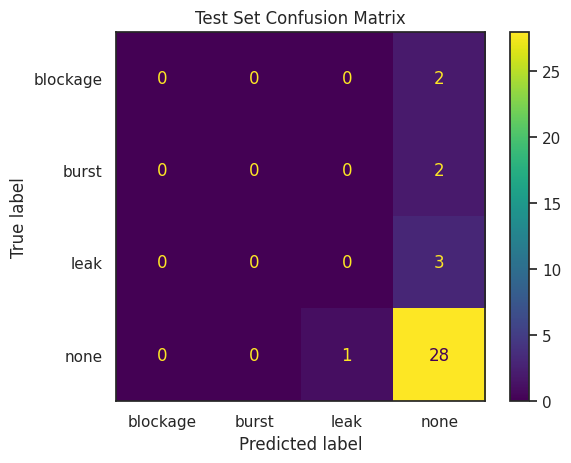

In [283]:
y_test_str = le.inverse_transform(y_test)
y_pred_str = le.inverse_transform(y_pred)

cm_test = confusion_matrix(y_test_str, y_pred_str, labels=le.classes_)
disp_test = ConfusionMatrixDisplay(confusion_matrix=cm_test, display_labels=le.classes_)
disp_test.plot(cmap='viridis')
plt.title("Test Set Confusion Matrix")
plt.show()

# **Evaluating the Model on the Training Set**

In [274]:
y_train_pred = clf_final.predict(X_trainval)
y_train_str  = le.inverse_transform(y_trainval)
y_train_pred_str = le.inverse_transform(y_train_pred)

# **Classification Report For Training Set**

In [275]:
print("Training Set Classification Report:\n")
print(classification_report(y_train_str, y_train_pred_str, zero_division=0))

Training Set Classification Report:

              precision    recall  f1-score   support

    blockage       1.00      1.00      1.00        10
       burst       1.00      1.00      1.00        10
        leak       1.00      1.00      1.00        18
        none       1.00      1.00      1.00       166

    accuracy                           1.00       204
   macro avg       1.00      1.00      1.00       204
weighted avg       1.00      1.00      1.00       204



# **Confusion Matrix for Training Set**

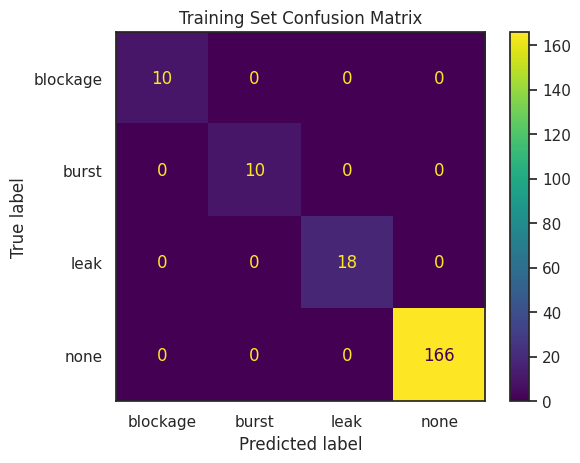

In [281]:
cm_train = confusion_matrix(y_train_str, y_train_pred_str, labels=le.classes_)
disp_train = ConfusionMatrixDisplay(confusion_matrix=cm_train, display_labels=le.classes_)
disp_train.plot(cmap='viridis')
plt.title("Training Set Confusion Matrix")
plt.show()

# **Plotting the PR-AUC Curve**

In [ ]:
# Binarizing the labels
n_classes = len(le.classes_)
y_test_bin = label_binarize(y_test, classes=list(range(n_classes)))

# Creating the figure
fig = go.Figure()

# Adding PR curve for each class
for i, cls in enumerate(le.classes_):
    precision, recall, _ = precision_recall_curve(y_test_bin[:, i], y_proba[:, i])
    ap = average_precision_score(y_test_bin[:, i], y_proba[:, i])
    fig.add_trace(go.Scatter(
        x=recall,
        y=precision,
        mode='lines',
        name=f"{cls} (AP={ap:.2f})",
        hovertemplate='Class: ' + str(cls) + '<br>Recall: %{x:.2f}<br>Precision: %{y:.2f}<extra></extra>'
    ))

# Adding the micro-average PR curve
precision_micro, recall_micro, _ = precision_recall_curve(y_test_bin.ravel(), y_proba.ravel())
ap_micro = average_precision_score(y_test_bin, y_proba, average='micro')
fig.add_trace(go.Scatter(
    x=recall_micro,
    y=precision_micro,
    mode='lines',
    name=f"Micro-Average (AP={ap_micro:.2f})",
    line=dict(dash='dash', color='black'),
    hovertemplate='Micro-Average<br>Recall: %{x:.2f}<br>Precision: %{y:.2f}<extra></extra>'
))

fig.update_layout(
    title='Multiclass Precision-Recall Curve',
    xaxis_title='Recall',
    yaxis_title='Precision',
    legend_title='Class',
    template='simple_white',
    width=900,
    height=600
)

fig.show()

# **Serializing the Trained Pipeline and the LabelEncoder for Later Use**

In [ ]:
# Saving the trained pipeline
joblib.dump(clf_final, '/mnt/d/TREASURY/ORDERS UNDER WORKING/icecarnage/Models/leak_classifier_pipeline.joblib')

# Saving the LabelEncoder
joblib.dump(le, '/mnt/d/TREASURY/ORDERS UNDER WORKING/icecarnage/Models/label_encoder.joblib')

print("Saved pipeline to models/leak_classifier_pipeline.joblib")
print("Saved label encoder to models/label_encoder.joblib")

Saved pipeline to models/leak_classifier_pipeline.joblib
Saved label encoder to models/label_encoder.joblib


# **Feature Threshold Extraction & Rule Export**

In [ ]:
MODEL_PATH= "/mnt/d/TREASURY/ORDERS UNDER WORKING/icecarnage/Model/leak_classifier_pipeline.joblib"
OUT_DIR = "/mnt/d/TREASURY/ORDERS UNDER WORKING/icecarnage/Interpretation"
CSV_PATH = os.path.join(OUT_DIR, "feature_thresholds.csv")
JSON_PATH = os.path.join(OUT_DIR, "feature_thresholds.json")
RULES_TXT_PATH = os.path.join(OUT_DIR, "feature_rules.txt")

os.makedirs(OUT_DIR, exist_ok=True)


# Loading the trained pipeline
clf_final = joblib.load(MODEL_PATH)
xgb_model = clf_final.named_steps['xgb']
preproc    = clf_final.named_steps['preproc']


# Reconstruct feature names post‑transform
numeric_feats   = ['flow_rate_lps','total_flow_volume_m3','nighttime_flow_rate_lps',
                   'flow_rate_change_per_min','pressure_psi','min_pressure_24h_psi',
                   'leak_noise_score','acoustic_amplitude_db','vibration_frequency_hz',
                   'zero_flow_duration_min','pipe_diameter_mm','pipe_age_years',
                   'valve_position_percent','pump_flow_rate_lps']
binary_feats    = ['unusual_usage_flag']
time_feats      = ['weekday','month','day','hour_sin','hour_cos']
location_feats  = ['coord_lat','coord_lon','inc_lat','inc_lon']
cat_feats       = ['pipe_material','valve_status','pump_state']

base_feats = numeric_feats + binary_feats + time_feats + location_feats
ohe         = preproc.named_transformers_['cat']
cat_ohe     = list(ohe.get_feature_names_out(cat_feats))
feature_names = base_feats + cat_ohe


# Parsing each tree's dump for split thresholds
dump      = xgb_model.get_booster().get_dump(with_stats=False)
split_re  = re.compile(r"\[f(\d+)<([0-9eE\+\-\.]+)\]")
thresholds = defaultdict(list)

for tree in dump:
    for line in tree.splitlines():
        m = split_re.search(line)
        if not m: continue
        idx, thr = int(m.group(1)), float(m.group(2))
        thresholds[feature_names[idx]].append(thr)


# Summarizing into a DataFrame
rows = []
for feat, vals in thresholds.items():
    arr  = np.array(vals)
    uniq = np.unique(arr)
    ftype = 'categorical' if (len(uniq)==1 and uniq[0]==1.0) else 'continuous'
    if ftype == 'continuous':
        q25, q50, q75 = np.quantile(arr, [0.25, 0.5, 0.75])
    else:
        q25 = q50 = q75 = None
    top3 = [v for v,_ in Counter(arr).most_common(3)]
    rows.append({
        'feature': feat,
        'type': ftype,
        '25% quantile': round(q25,3) if q25 is not None else None,
        '50% quantile': round(q50,3) if q50 is not None else None,
        '75% quantile': round(q75,3) if q75 is not None else None,
        'top split 1': round(top3[0],3) if len(top3)>0 else None,
        'top split 2': round(top3[1],3) if len(top3)>1 else None,
        'top split 3': round(top3[2],3) if len(top3)>2 else None,
    })

df_thresholds = pd.DataFrame(rows)\
                  .sort_values(['type','feature'])\
                  .reset_index(drop=True)


# Saving the structured thresholds
df_thresholds.to_csv(CSV_PATH, index=False)
df_thresholds.to_json(JSON_PATH, orient='records', lines=True)


# Saving human-readable rules
rules = []
for _, row in df_thresholds.iterrows():
    feat = row['feature']
    if row['type'] == 'categorical':
        rules.append(f"{feat}: split when == {row['top split 1']}")
    else:
        low, high = row['25% quantile'], row['75% quantile']
        rules.append(f"{feat}: low ≤{low}, med {low}–{high}, high >{high}")

with open(RULES_TXT_PATH, 'w') as f:
    for line in rules:
        f.write(line + "\n")

# Preview
print("\nThresholds DataFrame")
print(df_thresholds.to_string(index=False))
print("\nHuman‐Readable Rules")
for line in rules:
    print(line)


Thresholds DataFrame
                   feature        type  25% quantile  50% quantile  75% quantile  top split 1  top split 2  top split 3
      pipe_material_Copper categorical           NaN           NaN           NaN        1.000          NaN          NaN
pipe_material_Ductile Iron categorical           NaN           NaN           NaN        1.000          NaN          NaN
         pipe_material_PVC categorical           NaN           NaN           NaN        1.000          NaN          NaN
       pipe_material_Steel categorical           NaN           NaN           NaN        1.000          NaN          NaN
            pump_state_OFF categorical           NaN           NaN           NaN        1.000          NaN          NaN
             pump_state_ON categorical           NaN           NaN           NaN        1.000          NaN          NaN
        unusual_usage_flag categorical           NaN           NaN           NaN        1.000          NaN          NaN
       valve_statu